# kaggle Intel Image Classification
## Image Scene Classification of Multiclass

#### Import libraries and packages

In [ ]:
!pip install opencv-contrib-python

You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
!pip install seaborn

You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
import numpy as np
import pandas as pd
              
import matplotlib.pyplot as plt                        
%matplotlib inline   
import seaborn as sns                            

!pip install torch
!pip install torchvision
!pip install torchsummary
import torch
import torchvision.models as models
from PIL import Image
from torchvision import datasets
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
import torch.optim as optim
import os
import cv2

# Set PIL to be tolerant of image files that are truncated.
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

from torch.utils.data.sampler import SubsetRandomSampler
from glob import glob
import numpy as np
import random
from random import shuffle

from collections import Counter

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix

You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/venv/bin/python -m pip install --upgrade pip' command.


#### Import datasets

In [ ]:
#!pip install kaggle

In [ ]:
#!mv kaggle.json ~/.kaggle/kaggle.json
#!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#!kaggle datasets download -d puneet6060/intel-image-classification

In [ ]:
#!unzip intel-image-classification.zip

In [ ]:
#check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available. Training on CPU ...')
else:
    print('CUDA is available. Training on GPU ...')

CUDA is available. Training on GPU ...


In [ ]:
# define classes which are folders in each train and test directories with these names
classes =['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

#### Set the training parameters


In [ ]:
"""
parameters:
    aug_settings (pipelines): 
        _150, _224: resize,random horizontal flip, center crop
        _150_affine_pad, _224_affine_pad:   resize,random affine(rotation, shear, translate, scale),
                                            random horizontal flip, center crop, pad(edge)
        _150_affine_pad_jitter, _224_affine_pad_jitter: resize,random affine(rotation, shear, translate, scale),
                                                        random horizontal flip, center crop, pad(edge), color jitter

    optimizer_n: Adam, SGD 

    pretrained_model : resnet50,wide_resnet50_2,shufflenet_v2_x1_0, resnext50_32x4d, squeezenet1_1
"""

input_size=224
batch_size = 256
pretrained_model='resnet50'
optimizer_n ='SGD'
if optimizer_n=='SGD':
    lr=0.1 # constant learning rate
    momentum=0.9
else:
    lr=0 # to be used in the name of saved model, it is not the actual learning rate. Adam has adaptive rate
learning_rate =str(int(lr*100)) # to be used in the name of saved model
#files prefix
prefix='_'+str(input_size)+'_'+str(batch_size)+'_'+optimizer_n+'_'+str(learning_rate)
aug_settings = prefix 
n_epochs = 20

#### Transform the Data

We shape (resize) our input data into the shape that the pre-trained model expects

All pre-trained models expect input images normalized in the same way, i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224. The images have to be loaded in to a range of 0, 1 and then normalized using mean = (0.485, 0.456, 0.406) and std = (0.229, 0.224, 0.225).

https://pytorch.org/docs/stable/torchvision/models.html

In [ ]:
# load and transform data using ImageFolder for training, validation, test and predict sets

# ImageNet standardization
data_transforms={}
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
# transform image data to an augmented normalized float tensor  
if aug_settings ==prefix+'_affine_pad':                               
    data_transforms['train'] = transforms.Compose([transforms.Resize(input_size),
                                                    transforms.RandomAffine(degrees=10, translate=(0.1,0.1) , scale=(1,2), shear=(-10,10,-10,10)),
                                                    transforms.RandomHorizontalFlip(), #probability of the image being flipped is 0.5
                                                    transforms.CenterCrop(input_size),
                                                    transforms.Pad(1, padding_mode='edge'),
                                                    transforms.ToTensor(),# convert HWC in the range [0, 255] to a torch.FloatTensor of CHW in the range [0.0, 1.0]
                                                    normalize])
elif aug_settings == prefix+'_affine_pad_jitter':
    data_transforms['train'] = transforms.Compose([transforms.Resize(input_size),
                                                    transforms.RandomAffine(degrees=10, translate=(0.1,0.1) , scale=(1,2), shear=(-10,10,-10,10)),
                                                    transforms.RandomHorizontalFlip(), #probability of the image being flipped is 0.5
                                                    transforms.CenterCrop(input_size),
                                                    transforms.Pad(1, padding_mode='edge'),
                                                    transforms.ColorJitter(brightness=0.25,contrast=0.25,saturation=0.25, hue=0.15),
                                                    transforms.ToTensor(),# convert HWC in the range [0, 255] to a torch.FloatTensor of CHW in the range [0.0, 1.0]
                                                    normalize])
elif aug_settings == prefix:
    data_transforms['train'] = transforms.Compose([transforms.Resize(input_size),
                                                    transforms.RandomHorizontalFlip(), #probability of the image being flipped is 0.5
                                                    transforms.CenterCrop(input_size),
                                                    transforms.ToTensor(),# convert HWC in the range [0, 255] to a torch.FloatTensor of CHW in the range [0.0, 1.0]
                                                    normalize])

data_transforms['test'] = transforms.Compose([transforms.Resize(input_size),
                                                    transforms.CenterCrop(input_size),
                                                    transforms.ToTensor(),
                                                    normalize])                                    

# load and transform image data using ImageFolder 
data_dir ='data/'
images_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, 'seg_'+x), transform =data_transforms[x])
                   for x in ['train', 'test'] } 

# number of samples per batch to load
batch_size = batch_size
# number of subprocesses to use for data loading
num_workers = 0
# percentage of training set to use as validation
valid_size = 0.2   

# obtain train indices that will be used for validation
num_train = len(images_datasets['train'])
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define random samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

#prepare data loaders, combine dataset and sampler for train and validation set

loaders ={}
loaders['train'] = torch.utils.data.DataLoader(images_datasets['train'], batch_size=batch_size, sampler=train_sampler, 
                                                num_workers=num_workers)
loaders['valid'] = torch.utils.data.DataLoader(images_datasets['train'], batch_size=batch_size, sampler=valid_sampler, 
                                                num_workers=num_workers)
loaders['test'] = torch.utils.data.DataLoader(images_datasets['test'], batch_size=batch_size, num_workers=num_workers)

print('size of train, valid, test, and class: ', [len(train_sampler), len(valid_sampler),len(images_datasets['test']), len(classes)])

size of train, valid, test, and class:  [11228, 2806, 3000, 6]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

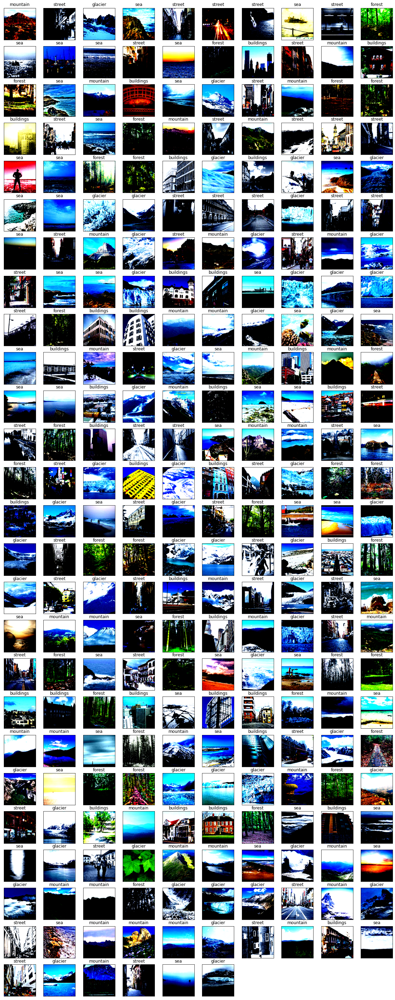

In [ ]:
# visualize sample train data
dataiter = iter(loaders['train'])
images, labels = dataiter.next()
# convert images to numpy for display
images = images.numpy()
# plot the images in the batch
n= batch_size//10 + 1   # number of rows
fig =  plt.figure(figsize=(20, n * 2))

for i in np.arange(batch_size):
    ax = fig.add_subplot(n, 10, i+1, xticks = [], yticks = [])   
    plt.imshow(np.transpose(images[i], (1,2,0)))
    ax.set_title(classes[labels[i]])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

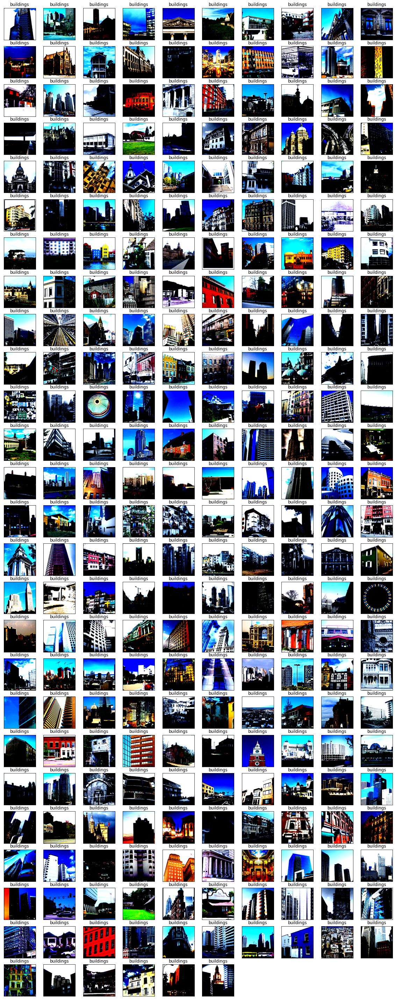

In [ ]:
# visualize sample test data
dataiter = iter(loaders['test'])
images, labels = dataiter.next()
# convert images to numpy for display
images = images.numpy()
# plot the images in the batch
n= batch_size//10 + 1   # number of rows
fig =  plt.figure(figsize=(20, 2 * n))

for i in np.arange(batch_size):
    ax = fig.add_subplot(n, 10, i+1, xticks = [], yticks = [])   
    plt.imshow(np.transpose(images[i], (1,2,0)))
    ax.set_title(classes[labels[i]])

#### Obtain model architecture

In [ ]:
#load the pretrained model from pytorch
if pretrained_model=='resnet50':
  model_transfer = models.resnet50(pretrained=True)
elif pretrained_model=='wide_resnet50_2':
    model_transfer=models.wide_resnet50_2(pretrained=True)
elif pretrained_model=='shufflenet_v2_x1_0':
    model_transfer=models.shufflenet_v2_x1_0(pretrained=True)
elif pretrained_model=='resnext50_32x4d':
    model_transfer=models.resnext50_32x4d(pretrained=True)
elif pretrained_model=='squeezenet1_1':
    model_transfer = models.squeezenet1_1(pretrained=True)

# print out the model structure
print(model_transfer)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# freeze training for all 'features' layers
for param in model_transfer.parameters():
    param.requires_grad = False
    
# final classifier layer
n_inputs = model_transfer.fc.in_features
#add last linear layer (n_inputs -> 6 classes)
#new layer automatically has require_grad = True
last_layer = nn.Linear(n_inputs, 6)
model_transfer.fc = last_layer

# if GPU is available, move the model to GPU
if train_on_gpu:
    model_transfer = model_transfer.cuda()

In [ ]:
summary(model_transfer, (3, input_size, input_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

#### Specify Loss Function and Optimizer

In [ ]:
# loss function: Categorical cross-entropy loss
criterion = nn.CrossEntropyLoss()

# optimizer: stochastic gradient descent
if optimizer_n == 'SGD':
    optimizer = optim.SGD(model_transfer.parameters(), lr=lr, momentum=momentum)
else:
    optimizer =optim.Adam(model_transfer.parameters())

#### Train and validate the model

In [ ]:
def train(n_epochs, loaders, model, optimizer, criterion, train_on_gpu, save_path, aug_settings, pretrained_model):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    loss_epoch =[]
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
             
            # clear the gradients of all optimized variable
            optimizer.zero_grad() 
            # forward pass
            output = model(data) 
            # calculate the batch loss
            loss = criterion (output, target) 
            # backpropagation
            loss.backward() 
            # Update weigths
            optimizer.step() 
            # update training loss
            train_loss +=  ((1 / (batch_idx + 1)) * (loss.data - train_loss))
                      
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            # forward pass
            output = model(data)
            # calculate the batch loss
            loss = criterion (output, target)
            # update validation loss
            valid_loss +=  ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        
        if valid_loss < valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min, valid_loss))            
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss

        loss_epoch.append((epoch, train_loss.item(), valid_loss.item()))

    #save the loss_epoch history
    df=pd.DataFrame.from_records(loss_epoch, columns=['epoch','Train_loss', 'Validation_loss'])
    df.to_csv('loss'+'_'+pretrained_model+aug_settings+'.csv', index=False)       
    # return trained model
    return model


In [ ]:
# train the model
n_epochs = n_epochs
model_transfer = train(n_epochs, loaders, model_transfer, optimizer, criterion, train_on_gpu, 'model_transfer'+'_'+pretrained_model+aug_settings+'.pt',aug_settings,pretrained_model)

# load the model that got the best validation accuracy 
model_transfer.load_state_dict(torch.load('model_transfer'+'_'+pretrained_model+aug_settings+'.pt'))

Epoch: 1 	Training Loss: 1.423215 	Validation Loss: 0.723103
Validation loss decreased (inf --> 0.723103).  Saving model ...
Epoch: 2 	Training Loss: 0.526232 	Validation Loss: 0.496942
Validation loss decreased (0.723103 --> 0.496942).  Saving model ...
Epoch: 3 	Training Loss: 0.542181 	Validation Loss: 0.559192
Epoch: 4 	Training Loss: 0.417241 	Validation Loss: 0.376768
Validation loss decreased (0.496942 --> 0.376768).  Saving model ...
Epoch: 5 	Training Loss: 0.474262 	Validation Loss: 0.586032
Epoch: 6 	Training Loss: 0.341365 	Validation Loss: 0.359242
Validation loss decreased (0.376768 --> 0.359242).  Saving model ...
Epoch: 7 	Training Loss: 0.370669 	Validation Loss: 0.472137
Epoch: 8 	Training Loss: 0.327356 	Validation Loss: 0.338923
Validation loss decreased (0.359242 --> 0.338923).  Saving model ...
Epoch: 9 	Training Loss: 0.273907 	Validation Loss: 0.379605
Epoch: 10 	Training Loss: 0.289399 	Validation Loss: 0.361584
Epoch: 11 	Training Loss: 0.421870 	Validation Lo

<All keys matched successfully>

#### Test the model

In [ ]:
def test(loaders, model, criterion, train_on_gpu):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.
    
    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

    
# call test function    
test(loaders, model_transfer, criterion, train_on_gpu)

Test Loss: 0.371479


Test Accuracy: 90% (2720/3000)


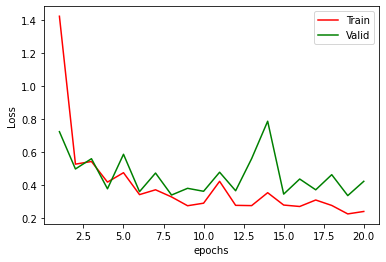

In [ ]:
# plot the variation of train and validation losses vs n_epochs
loss=pd.read_csv('loss'+'_'+pretrained_model+aug_settings+'.csv',header=0,index_col=False)
plt.plot(loss['epoch'],loss['Train_loss'],'r',loss['epoch'],loss['Validation_loss'],'g')
plt.xlabel('epochs')
plt.ylabel('Loss')
plt.legend(labels=['Train','Valid'])
plt.show()

#### Predict the labels of the 'pred' set

Number of prediction images: 7301


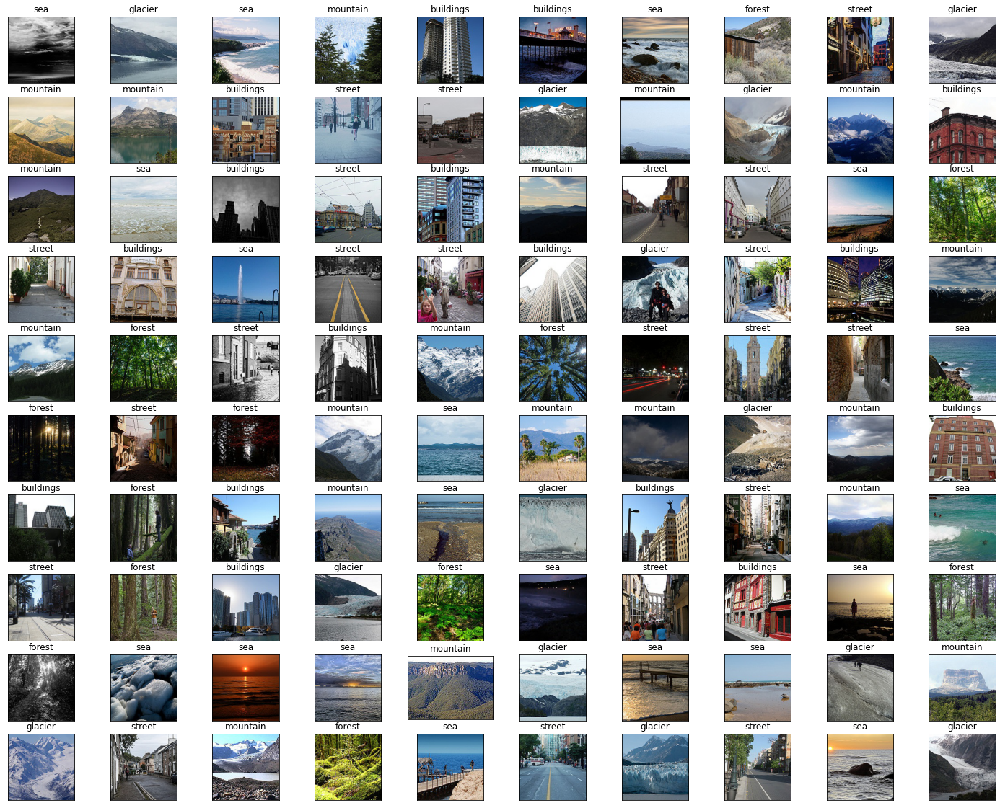

In [ ]:
# prediction function
def predict(img_path, model, train_on_gpu):
    model.eval()
    # load the image and return the prediction
    img = Image.open(img_path)
    img = data_transforms['test'](img)
    if train_on_gpu:
        img = img.cuda()
    output = model(torch.unsqueeze(img, 0))
    idx = torch.argmax(output, dim=1)
    return classes[idx]

# visualize sample of predictions
def pred_plot(files, model, train_on_gpu):
    n=len(files)//10
    fig = plt.figure(figsize=(25,2*n))
    for i,f in enumerate(files):
        ax = fig.add_subplot(n, 10, i+1, xticks=[], yticks=[])
        pred = predict(f, model, train_on_gpu)
        img = Image.open(f)
        img = np.array(img)
        plt.imshow(img)
        plt.title(pred)

files=np.array(glob("data/seg_pred/*.jpg"))
print("Number of prediction images:",len(files))
#random.shuffle(files)

pred_plot(files[0:100], model_transfer, train_on_gpu)

##### Obtain the number of instances in each class of test set and information about misclassified classes

In [ ]:
# this function is written based on batch_size=1, hence a different loader is defined for it
def misclassified_info(loader, classes, model, train_on_gpu):
    model.eval()
    misclassified=dict.fromkeys(classes)
    for key in misclassified.keys():
        misclassified[key]=[]
    classes_cnt=[0]*len(classes)
    for data,target in loader:
        if train_on_gpu:        
            data= data.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        idx = output.data.max(1, keepdim=True)[1]
        pred = classes[idx]
        if pred!= classes[target.item()]:
            misclassified[classes[target.item()]].append(pred)
        classes_cnt[target.item()] +=1
    
    # obtain the number of instances in each class
    instances=[classes[i]+':'+str(cnt) for i, cnt in enumerate(classes_cnt)]

    misclassified_cnt=dict.fromkeys(classes)
    for key in misclassified.keys():
        misclassified_cnt[key]=Counter(list(misclassified[key]))
    df_mc_cnt=pd.DataFrame.from_dict(misclassified_cnt).fillna(0)

    return df_mc_cnt, instances

test_dataloader = torch.utils.data.DataLoader(images_datasets['test'],batch_size=1, 
                                                num_workers=0)
df_mc_cnt, instances = misclassified_info(test_dataloader, classes, model_transfer, train_on_gpu)  
# number of images in each class   
print('Number of instances in each class:')
print(instances)
print()
#Table of wrong predictions per class
print(df_mc_cnt)          

Number of instances in each class:
['buildings:437', 'forest:474', 'glacier:553', 'mountain:525', 'sea:510', 'street:501']

           buildings  forest  glacier  mountain  sea  street
street          24.0     1.0      0.0       0.0  0.0     0.0
sea              4.0     1.0     29.0      21.0  0.0     5.0
glacier          1.0     0.0      0.0      33.0  4.0     0.0
mountain         0.0     2.0     97.0       0.0  6.0     0.0
buildings        0.0     0.0      1.0       1.0  1.0    44.0
forest           0.0     0.0      2.0       2.0  1.0     0.0


#### Obtain the ground truth and predicted labels for the 'test' set

In [ ]:
def classification_results(loaders, model, train_on_gpu):
    model.eval()
    y_pred = []
    y_true = []
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        pred = output.data.max(1, keepdim=True)[1]
        y_pred.extend(pred.cpu().numpy())
        y_true.extend(target.cpu().numpy())

    return  y_true, y_pred

y_true, y_pred = classification_results(loaders, model_transfer, train_on_gpu)

#### Classification report

In [ ]:
"""
Precision – Accuracy of positive predictions: Precision = TP/(TP + FP) 
Recall (aka sensitivity or true positive rate): Fraction of positives that were correctly identified. Recall = TP/(TP+FN)
F1 Score (aka F-Score or F-Measure) –  The harmonic mean of precision and recall. F1 = 2 x (precision x recall)/(precision + recall)
"""
precision, recall, fscore, support = score(y_true, y_pred)
print(classification_report(y_true,y_pred, target_names=classes))

print('Mean recall: {0:.2%}'.format(np.mean(recall)))
print('Mean precision: {0:.2%}'.format(np.mean(precision)))
idx = np.argmin(precision)
print('Class with the lowest precision: {} - {}'.format(classes[idx], precision[idx]))
idx = np.argmin(recall)
print('Class with the lowest recall: {} - {}'.format(classes[idx], recall[idx]))

              precision    recall  f1-score   support

   buildings       0.90      0.93      0.91       437
      forest       0.99      0.99      0.99       474
     glacier       0.92      0.77      0.84       553
    mountain       0.82      0.89      0.85       525
         sea       0.89      0.98      0.93       510
      street       0.95      0.90      0.92       501

    accuracy                           0.91      3000
   macro avg       0.91      0.91      0.91      3000
weighted avg       0.91      0.91      0.91      3000

Mean recall: 91.03%
Mean precision: 91.01%
Class with the lowest precision: mountain - 0.8167539267015707
Class with the lowest recall: glacier - 0.7667269439421338
